# Problem 1

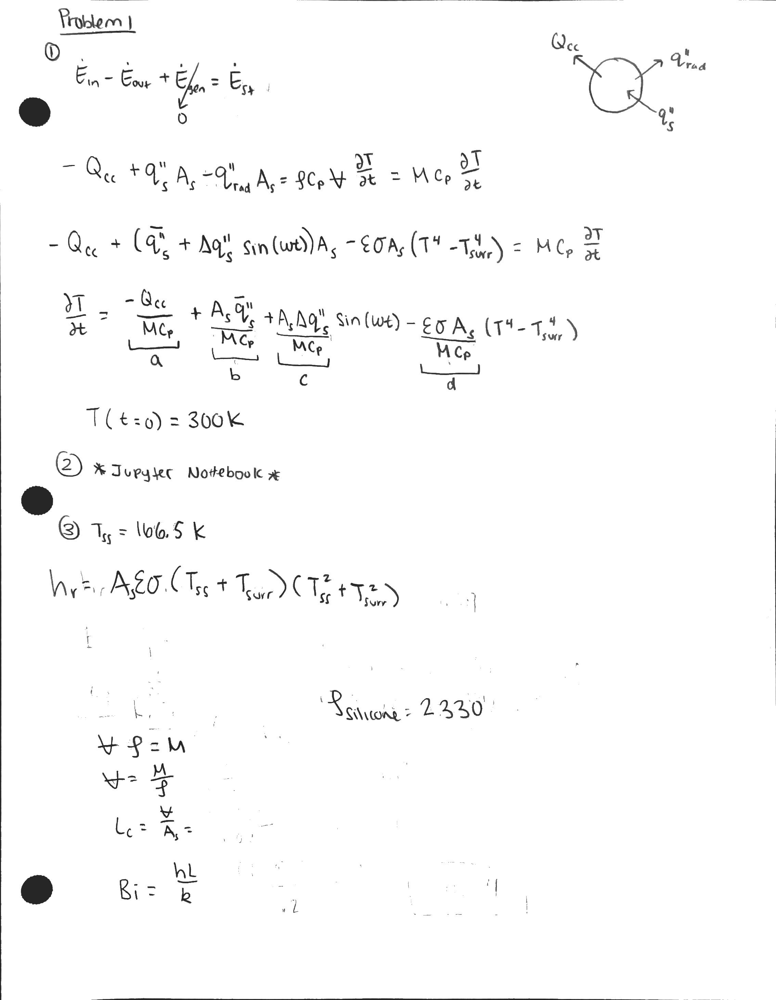

Steady state Temperature [K]: 166.46439747859714
h_r [W/m^2K]: 0.021792869612218595


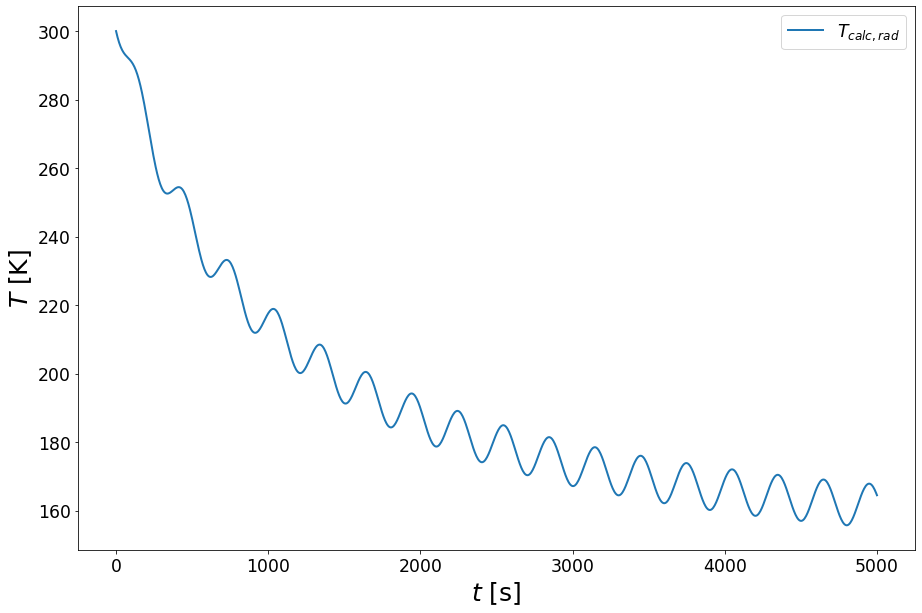

In [27]:
#@title
# import a few more things
from scipy.integrate import odeint
from scipy.constants import Stefan_Boltzmann as sigma   #Stefan-Boltzmann Constant [W/m^2-K^4]
import math # math functions
import numpy as np # numerical math
from numpy import *
from scipy.linalg import solve
from scipy.constants import pi 

# Widgets
import ipywidgets as widgets
from IPython.display import display
from ipywidgets import interact

#plotting
params = {'legend.fontsize': 'xx-large',
          'figure.figsize': (15, 10),
         'axes.labelsize': 'xx-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'xx-large',
         'ytick.labelsize':'xx-large'}
import matplotlib.pyplot as plt
plt.rcParams.update(params)
# Additional Parameters
T_surr = 300  #[K] surroudnings temperature
epsilon = 0.35      #[-] Estimate for emissivity 
t_max=5000
sigma=5.67*10**-8
Ti=300
Qcc=5
M=0.05
As=0.02
omega=0.02094
cp=300
def model(y,t,a,b,c, d, T_surr):    # Set up the function that returns dTdt
    dTdt = a+b+c*sin(omega*t)+d*(y**4-T_surr**4)
    return dTdt

a = -Qcc/(M*cp)
b = 100*As/(M*cp)
c = 100*As/(M*cp)
d=-epsilon*sigma*As/(M*cp)

t = np.linspace(0,t_max,1000)

Tr = odeint(model,Ti, t, args=(a,b,c, d, T_surr))
plt.plot(t,Tr,label = '$T_{calc,rad}$', lw =2)
plt.xlabel("$t$ [s]",fontsize=25)
plt.ylabel("$T$ [K]",fontsize=25)
plt.legend( )

T_ss=sum(Tr[-10:])/len(Tr[-10:])
print('Steady state Temperature [K]:', T_ss)
h_r=epsilon*sigma*As*(T_ss+T_surr)*(T_ss**2+T_surr**2)
print('h_r [W/m^2K]:', h_r)


In [28]:
rho=2330
ks=[884, 264]
kT=[100,200]
k=np.interp(T_ss, kT, ks)
V=M/rho
Lc=V/As
Bi=h_r*Lc/k
print('Bi=', Bi)

Bi= 4.954837866553643e-08


# Problem 2

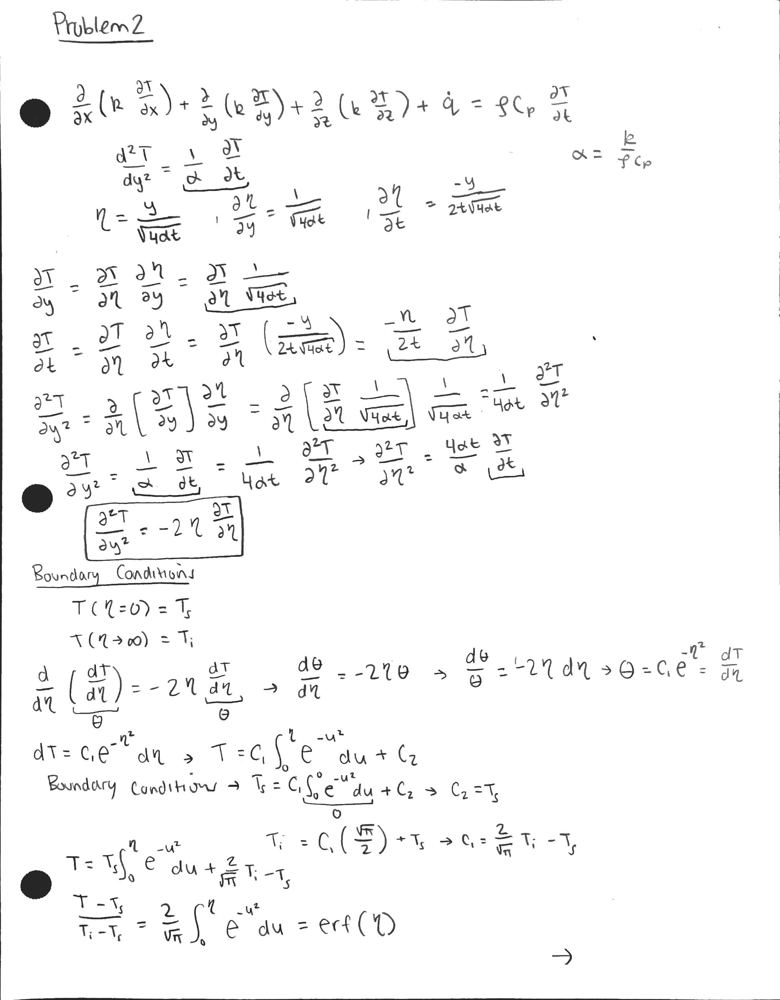

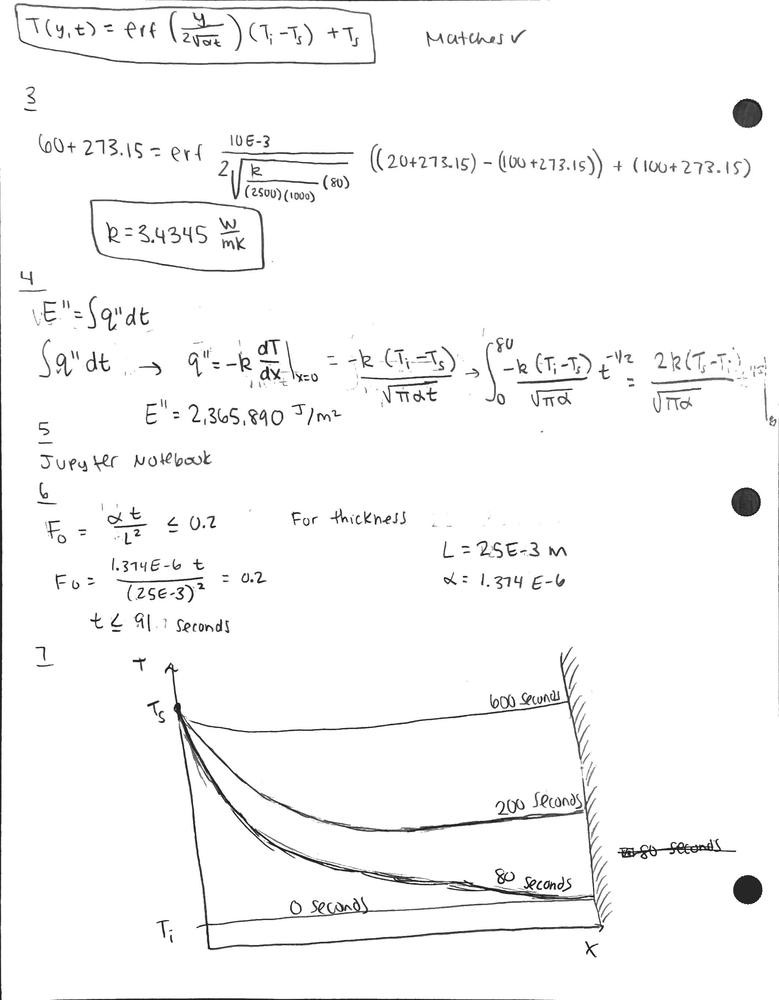

In [29]:
#Symbolic math
import sympy # symbolic math
import numpy as np # numerical math

from sympy import *
import math # math functions
from sympy import oo
k, Ti, Ts, alpha, x, t, eta, rho, cp, L = symbols('k Ti Ts alpha x t eta rho cp L')
T  = symbols('T', cls=Function)    # define T as a function
eq = T(eta).diff(eta,eta)+2*eta*T(eta).diff(eta)
T = dsolve(eq)
C1, C2 = symbols('C1 C2')     # define these as symbols
constants = sympy.solve([T.rhs.subs(eta,0)-Ts,T.rhs.subs(eta,oo)-Ti],[C1,C2])  #Solve for C1-C2
T = T.rhs.subs(constants).simplify()  # Substitute constants C1 and C2 into the equation
T = T.subs(eta,x/(4*alpha*t)**(1/2))  # Substitute x,t into the equation instead of eta
T_s=60+273.15
rhos=2500
cps=1000
ts=80
Ts_s=100+273.15
Tis=20+273.15
Ls=10*10**-3
T = T.subs([(Ti, Tis), (Ts, Ts_s), (x, Ls), (t, ts)])
alphavalue=sympy.solve(T - T_s, alpha)
alphas=1.37381833644858*10**-6
ks=alphas*rhos*cps
print('k [W/mK]=', ks)


k [W/mK]= 3.4345458411214502


In [30]:
Thermal_Energy = (2*ks*(Ts_s-Tis)*ts**(1/2))/((math.pi*alphas)**(1/2))
print(Thermal_Energy)

2365890.8399153897


Text(0, 0.5, '$T$ [K]')

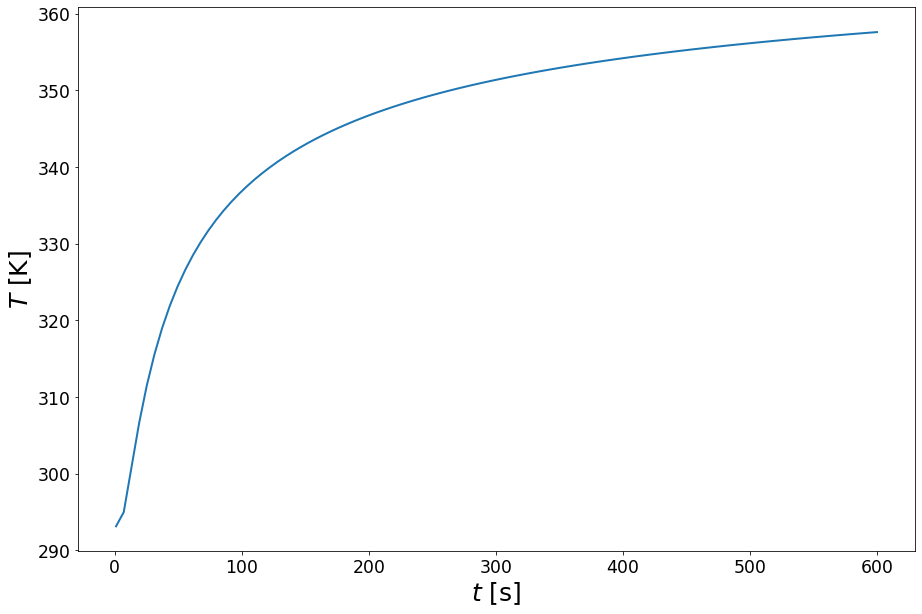

In [31]:
import matplotlib.pyplot as plt
k, Ti, Ts, alpha, x, t, eta, rho, cp, L = symbols('k Ti Ts alpha x t eta rho cp L')
T  = symbols('T', cls=Function)    # define T as a function
eq = T(eta).diff(eta,eta)+2*eta*T(eta).diff(eta)
T = dsolve(eq)
C1, C2 = symbols('C1 C2')     # define these as symbols
constants = sympy.solve([T.rhs.subs(eta,0)-Ts,T.rhs.subs(eta,oo)-Ti],[C1,C2])  #Solve for C1-C2
T = T.rhs.subs(constants).simplify()  # Substitute constants C1 and C2 into the equation
T = T.subs(eta,x/(4*alpha*t)**(1/2))  # Substitute x,t into the equation instead of eta
rhos=2500
ks=3.4345458411214502
alphas=1.37381833644858*10**-6
cps=1000
Ts_s=100+273.15
Tis=20+273.15
Ls=10*10**-3
Tp = T.subs([(Ti, Tis), (Ts, Ts_s), (x, Ls), (alpha, alphas)])
Tp = lambdify(t, Tp,"numpy")
Tp = np.vectorize(Tp)
tp = np.linspace(1, 10*60,num=100)
Tp=Tp(tp)
plt.plot(tp,Tp,label = 'T', lw =2)
plt.xlabel("$t$ [s]",fontsize=25)
plt.ylabel("$T$ [K]",fontsize=25)


Text(0, 0.5, "$q''$ [W/m^2]")

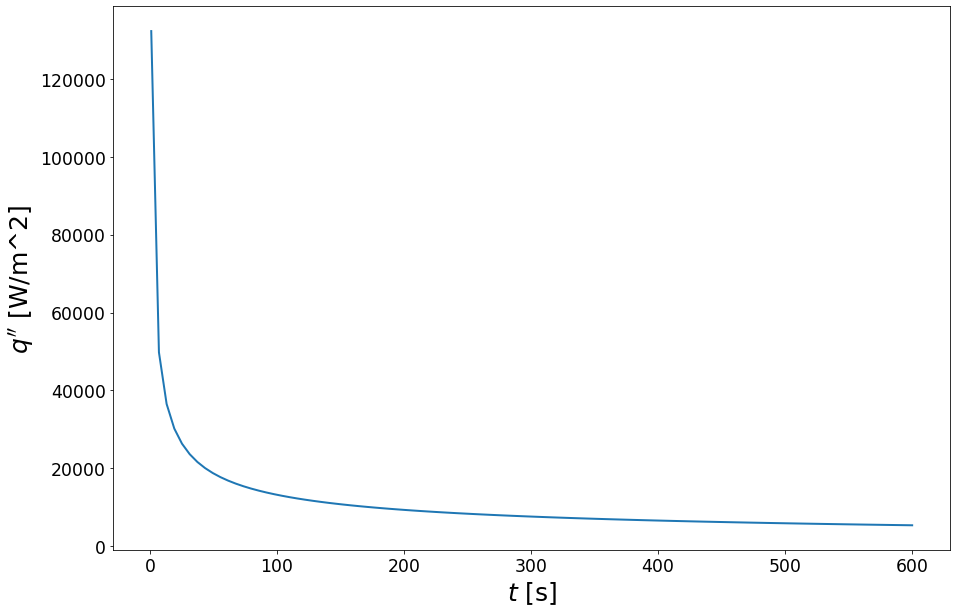

In [32]:
q_dprime = ks*(Ts_s-Tis)/((math.pi*alphas*tp)**(1/2))
plt.plot(tp,q_dprime,label = 'T', lw =2)
plt.xlabel("$t$ [s]",fontsize=25)
plt.ylabel("$q''$ [W/m^2]",fontsize=25)

In [33]:
time=0.2*(25*10**-3)**2/(1.374*10**-6)
print('time less than', time)

time less than 90.97525473071326


# Problem 3

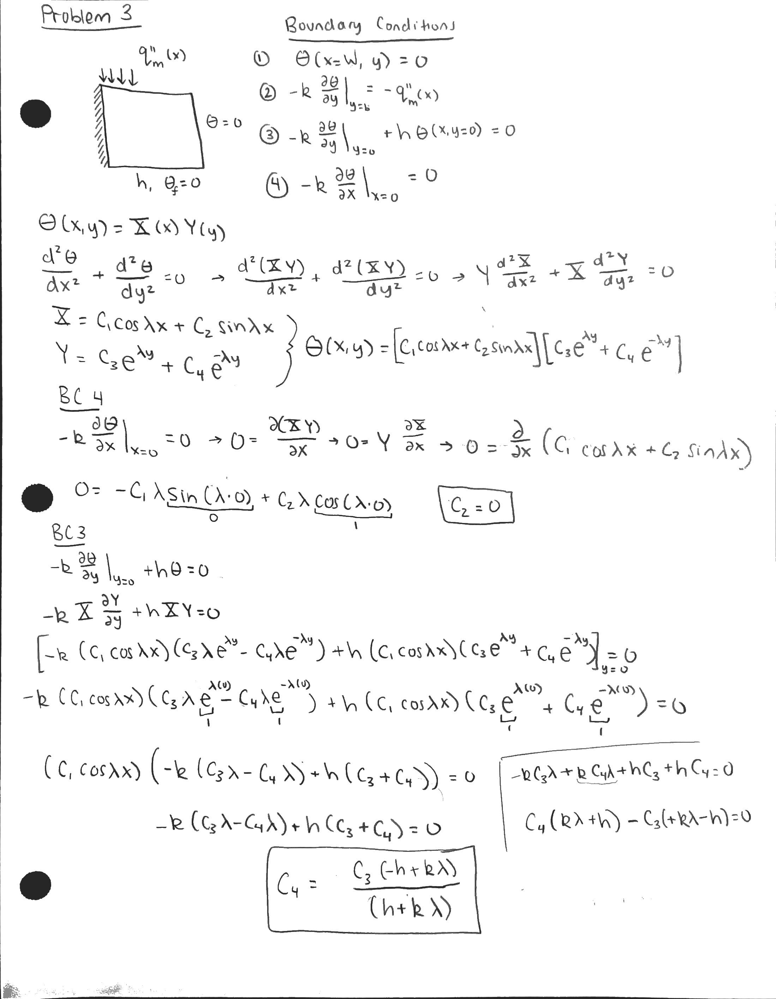

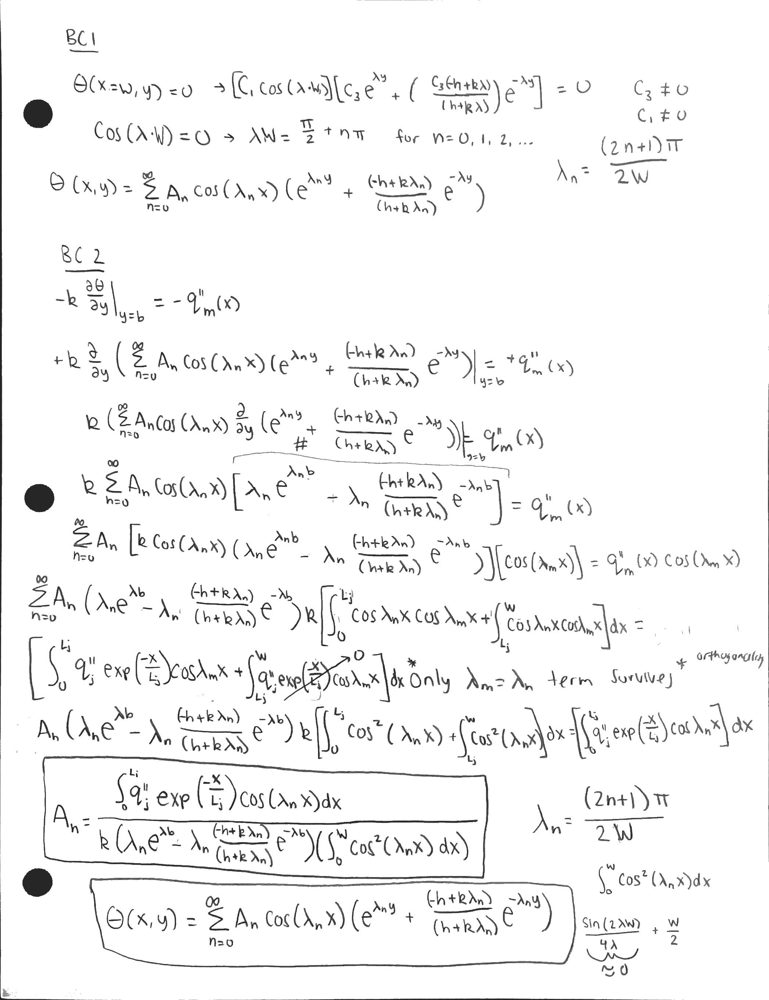

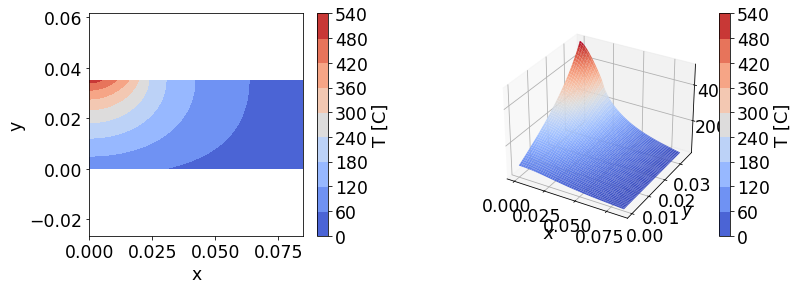

In [34]:
params = {'legend.fontsize': 'xx-large',
          'figure.figsize': (15, 10),
         'axes.labelsize': 'xx-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'xx-large',
         'ytick.labelsize':'xx-large'}
import matplotlib.pyplot as plt
plt.rcParams.update(params)

#Numerical Math
import math # math functions
import numpy as np # numerical math
import scipy 
from numpy import *
from scipy import integrate
from scipy.linalg import solve

# Widgets
import ipywidgets as widgets
from IPython.display import display
from ipywidgets import interact
N=100
Nr=100
W=0.085
b=0.035
k=38
Ts=25+273.15
q_dprime_j=10**6
Lj=0.02
h=5000
x = np.linspace(0,W,num=N)
y = np.linspace(0,b,num=N)
xx,yy = meshgrid(x,y)   # Set up the grid for plotting
T2 = np.zeros([N,N])    #Set up the temperature array for Theta = normalized T
A = zeros(Nr)
for n in range(0,Nr):   # interate from n = 1 ... inf, where we approximate inf with a large number
    # un at one value of n we have to sum up the solutions from n = 1 to ~inf
    l = (2*n+1)*pi/(2*W)   #calcualte the nth root
    An,err = scipy.integrate.quad(lambda xp: q_dprime_j*exp(-xp/Lj)*cos(l*xp),0,Lj)
    Ad1 = k*(l*exp(l*b)-l*((-h+k*l)/(h+k*l))*exp(-l*b))
    Ad2 = W/2
    A = An/(Ad1*Ad2)
    un = A*cos(l*xx)*(exp(l*yy)+((-h+k*l)/(h+k*l))*exp(-l*yy))
    T2 = T2 + un
T=(T2+Ts)-273.15
#Plot temperature-----------------------------------------------------------
fig = plt.figure(figsize=plt.figaspect(0.5))
ax = fig.add_subplot(2, 2, 1)
fig.subplots_adjust(wspace=0.5)
fig.set_figheight(9)
fig.set_figwidth(12)

ct = ax.contourf(xx,yy,T,cmap='coolwarm')
ax.axis('equal');  
cbar = fig.colorbar(ct)
cbar.set_label('T [C]', fontsize = 18)
ax.set_xlabel('x')
ax.set_ylabel('y')

ax = fig.add_subplot(2, 2, 2, projection='3d')
ax.plot_surface(xx, yy, T, cmap='coolwarm') 
ax.set(xlabel='$x$', ylabel='$y$')
cbar =  fig.colorbar(ct)
cbar.set_label('T [C]', fontsize = 18)


In [35]:
Ns=100
Nr=100
x=np.linspace(0,W, num=Ns)
y=[0, 0.01, 0.02, 0.03, 0.035]
T2=np.zeros(Ns)
Theta=[None, None, None, None, None]
for i in range(size(Theta)):
    for n in range(0, Nr):
        l = (2*n+1)*pi/(2*W)   #calcualte the nth root
        An,err = scipy.integrate.quad(lambda xp: q_dprime_j*exp(-xp/Lj)*cos(l*xp),0,Lj)
        Ad1 = k*(l*exp((l*b))+l*((h-k*l)/(h+k*l))*exp((-l*b)))
        Ad2 = W/2
        A = An/(Ad1*Ad2)
        un = A*cos(l*x)*(exp(l*y[i])-((h-k*l)/(h+k*l))*exp(-l*y[i]))
        T2 = T2 + un
    Theta[i]=(T2+Ts)-273.15


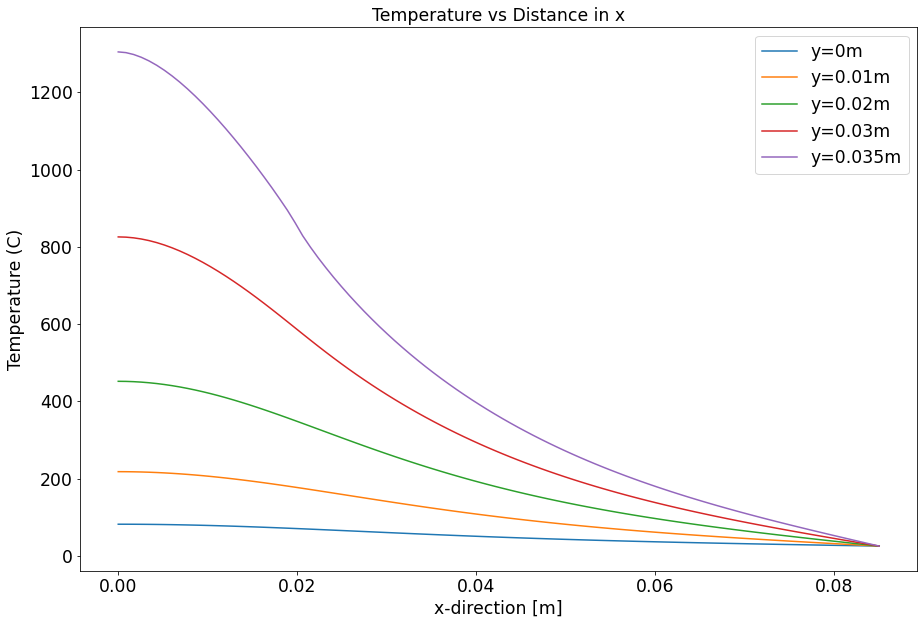

In [36]:
for i in range(5):
    label=str("y=" +str(y[i])+'m')
    plt.plot(x, Theta[i], label=label)
    plt.xlabel('x-direction [m]')
    plt.ylabel('Temperature (C)')
    plt.title('Temperature vs Distance in x')
plt.legend()
plt.show()

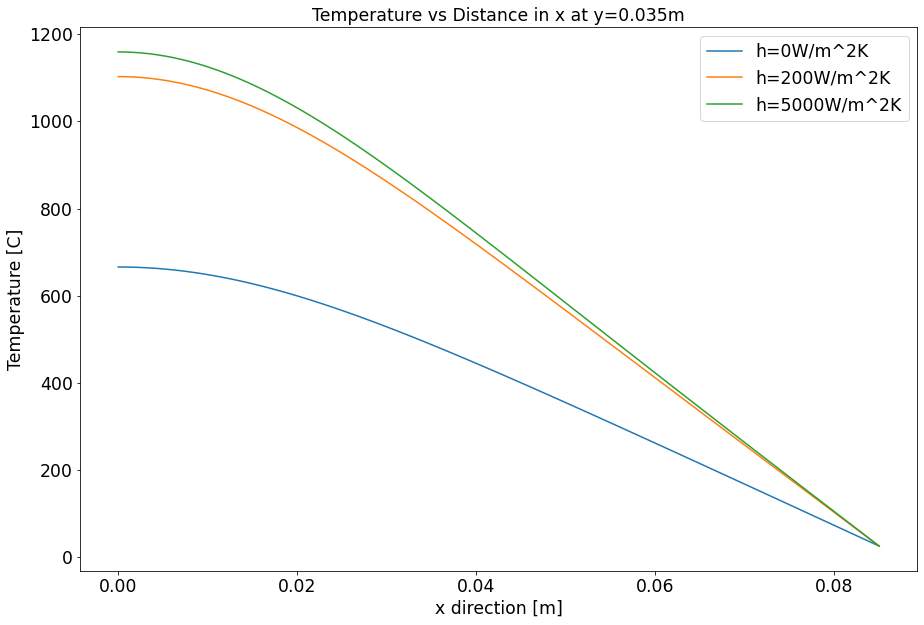

In [37]:
hy=[0,200,5000]
y=[0,0.035]
T2=np.zeros(Ns)
Thetay=[None, None, None]
Thetay0=[None, None, None]
for i in range(size(hy)):
    for n in range(0, Nr):
        l = (2*n+1)*pi/(2*W)   #calcualte the nth root
        An,err = scipy.integrate.quad(lambda xp: q_dprime_j*exp(-xp/Lj)*cos(l*xp),0,Lj)
        Ad1 = k*(l*exp((l*b))+l*((hy[i]-k*l)/(hy[i]+k*l))*exp((-l*b)))
        Ad2 = W/2
        A = An/(Ad1*Ad2)
        un = A*cos(l*x)*(exp(l*y[0])-((hy[i]-k*l)/(hy[i]+k*l))*exp(-l*y[0]))
        T2 = T2 + un
    Thetay0[i]=(T2+Ts)-273.15
for i in range(3):
    label=str("h=" +str(hy[i])+'W/m^2K')
    plt.plot(x, Thetay0[i], label=label)
    plt.xlabel('x direction [m]')
    plt.ylabel('Temperature [C]')
    plt.title('Temperature vs Distance in x at y=0.035m')
plt.legend()
plt.show()

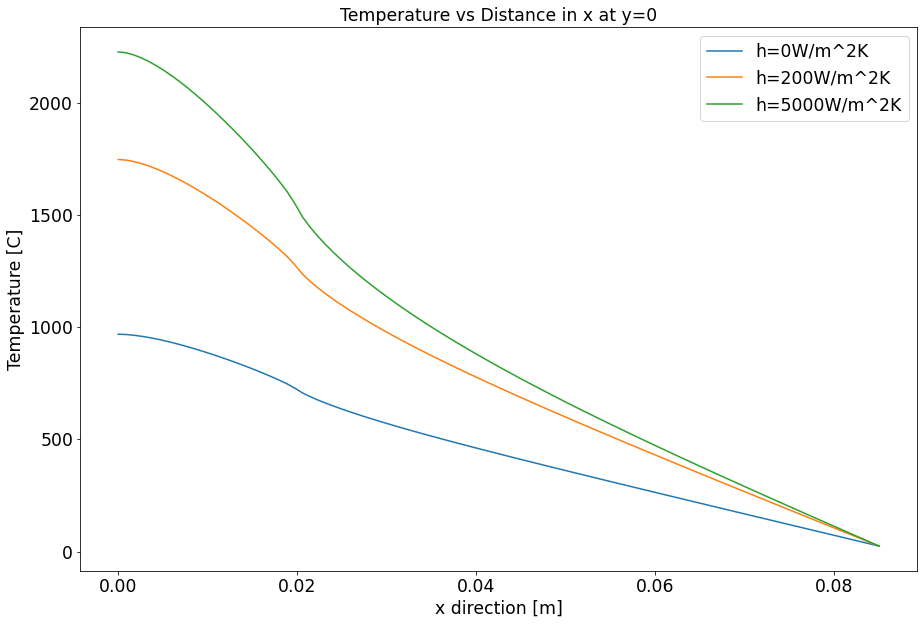

In [38]:
hy=[0,200,5000]
y=[0,0.035]
T2=np.zeros(Ns)
Thetay=[None, None, None]
Thetay35=[None, None, None]
for i in range(size(hy)):
    for n in range(0, Nr):
        l = (2*n+1)*pi/(2*W)   #calcualte the nth root
        An,err = scipy.integrate.quad(lambda xp: q_dprime_j*exp(-xp/Lj)*cos(l*xp),0,Lj)
        Ad1 = k*(l*exp((l*b))+l*((hy[i]-k*l)/(hy[i]+k*l))*exp((-l*b)))
        Ad2 = W/2
        A = An/(Ad1*Ad2)
        un = A*cos(l*x)*(exp(l*y[1])-((hy[i]-k*l)/(hy[i]+k*l))*exp(-l*y[1]))
        T2 = T2 + un
    Thetay35[i]=(T2+Ts)-273.15
for i in range(3):
    label=str("h=" +str(hy[i])+'W/m^2K')
    plt.plot(x, Thetay35[i], label=label)
    plt.xlabel('x direction [m]')
    plt.ylabel('Temperature [C]')
    plt.title('Temperature vs Distance in x at y=0')
plt.legend()
plt.show()

# Problem 4

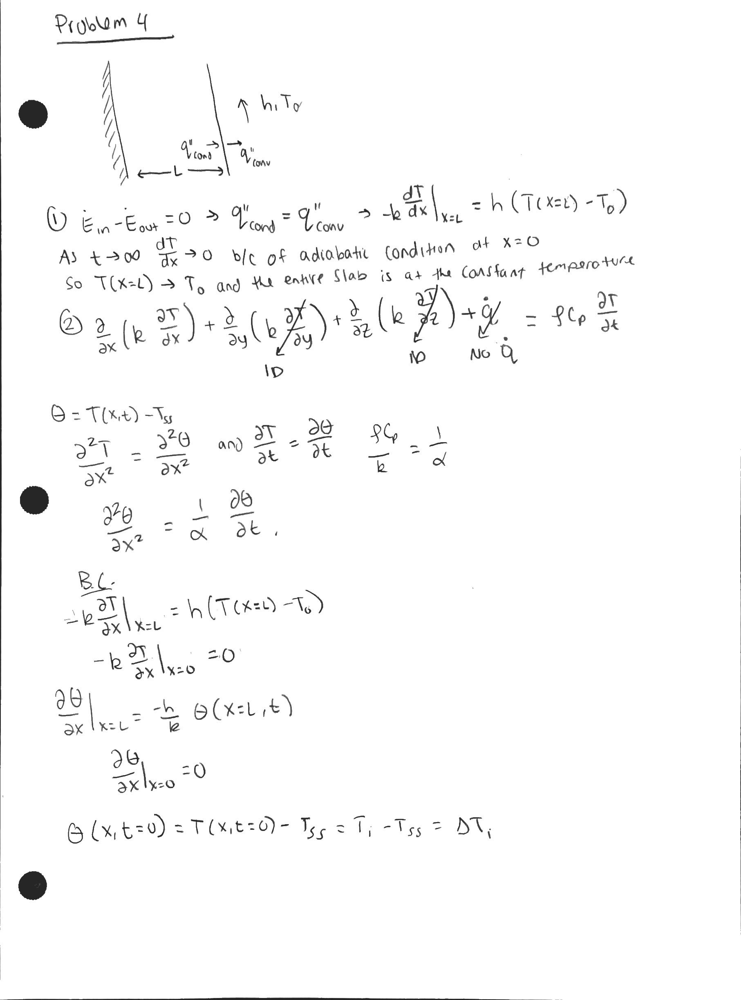

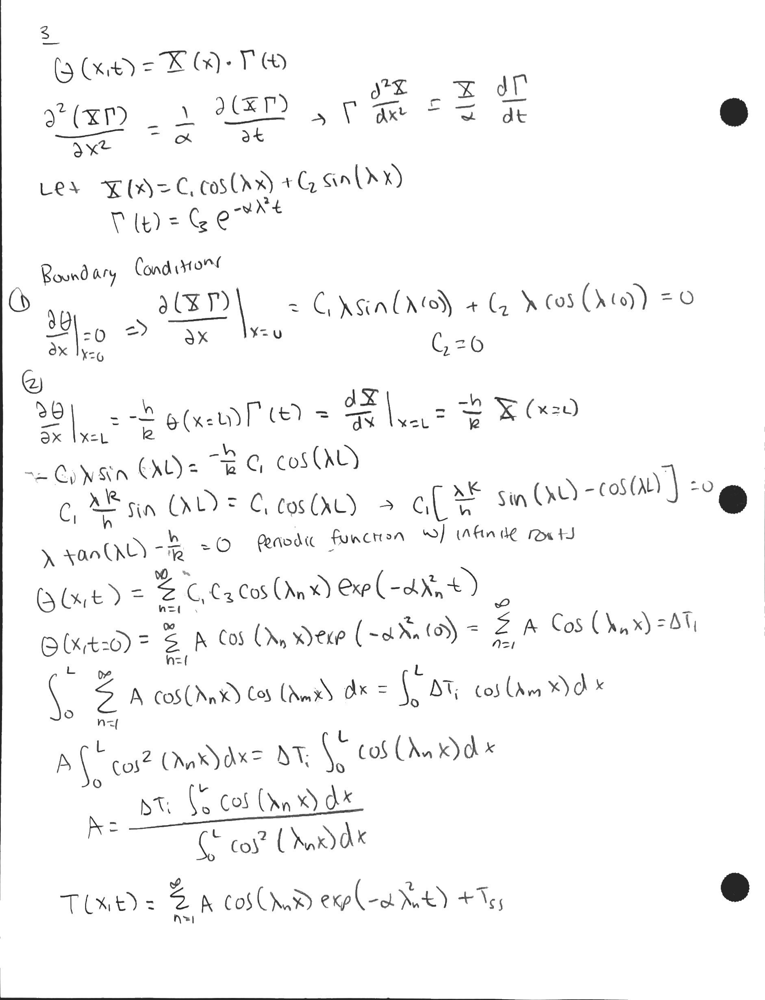

In [1]:
L=0.025
Ti=20
h=1000
T0=100
rho=2500
cp=1000
k=1
alpha=k/(rho*cp)
Tss=T0
TDelta=Ti-Tss

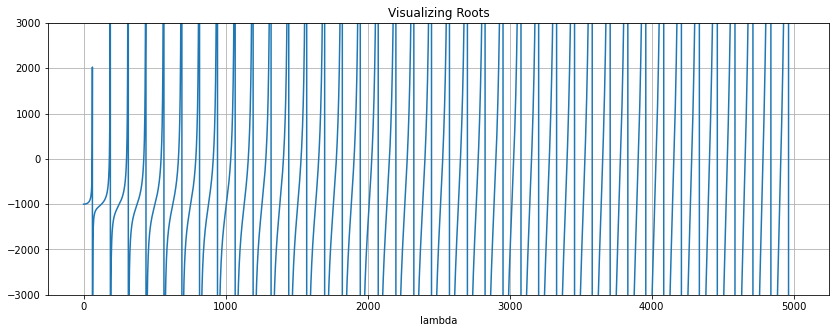

In [6]:
import matplotlib.pyplot as plt
#Numerical Math
import math # math functions
import numpy as np # numerical math
import scipy 
from numpy import *
from scipy import integrate
from scipy.linalg import solve

# Widgets
import ipywidgets as widgets
from IPython.display import display
from ipywidgets import interact
l=np.linspace(0,5000,5000)
def f(l):
    return l*tan(L*l)-(h/k)
plt.figure(figsize=(14,5))
plt.plot(l, f(l))
plt.ylim(-3000, 3000)
plt.grid()
plt.title('Visualizing Roots')
plt.xlabel('lambda')
plt.show()

In [7]:
zx=np.where(np.diff(np.sign(f(l))))[0]
zx=zx[::2]
lambdas=np.zeros(len(zx))
for i in range(len(zx)):
    lambdas[i]=scipy.optimize.brentq(f, l[zx[i]],l[zx[i]+1])
print(lambdas)

[  60.41806468  181.32068402  302.41251964  423.78918628  545.51106639
  667.60432496  790.06787556  912.88231665 1036.01803233 1159.44125141
 1283.11798177 1407.01624665 1531.10715076 1655.36522149 1779.76834291
 1904.29748687 2028.93636299 2153.67105517 2278.48967871 2403.38207325
 2528.33953583 2653.35459293 2778.42080797 2903.53261989 3028.68520808
 3153.87437973 3279.09647568 3404.34829176 3529.62701301 3654.93015834
 3780.25553412 3905.60119494 4030.96541042 4156.3466371  4281.74349443
 4407.1547443  4532.57927356 4658.01607889 4783.46425388 4908.92297778]


(-5000.0, 5000.0)

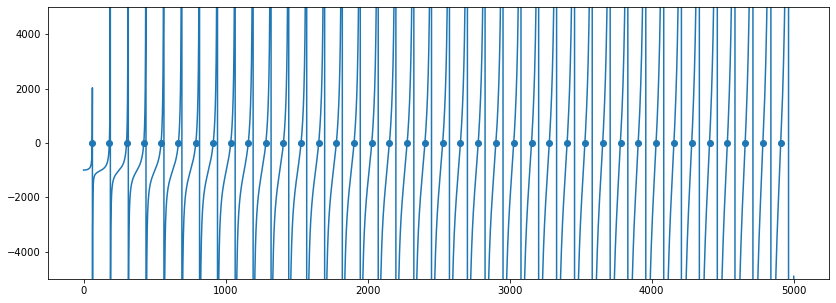

In [9]:
plt.figure(figsize=(14,5))
plt.plot(l, f(l))
plt.scatter(lambdas, f(lambdas))
plt.ylim(-5000,5000)

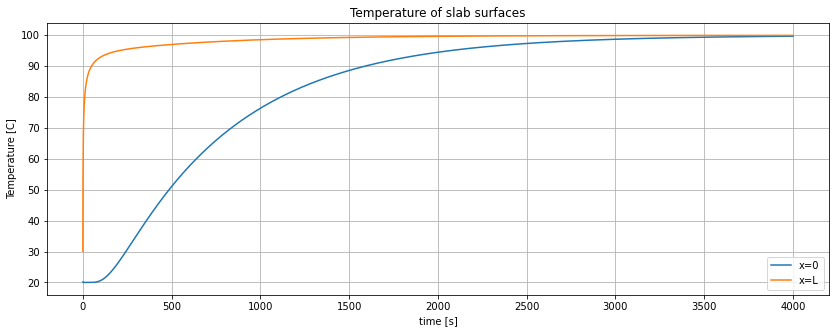

In [11]:
Nx=251
Nt=4000
x=np.linspace(0,L,num=Nx)
t=np.linspace(0, Nt, num=Nt)
xx, tt=meshgrid(x,t)
theta=np.zeros([len(t),len(x)])
A=np.zeros(len(lambdas))
for n in range(len(lambdas)):
    l=lambdas[n]
    AnumIntegral, err1=scipy.integrate.quad(lambda x: cos(l*x), 0, L)
    Anum=TDelta*AnumIntegral
    Aden, err2=scipy.integrate.quad(lambda x: (cos(l*x))**2, 0,L)
    A[n]=Anum/Aden
    xterm=cos(l*xx)
    tterm=exp(-alpha*l**2*tt)
    thetan=A[n]*xterm*tterm
    theta=theta+thetan
T=theta+Tss*np.ones([len(t), len(x)])

plt.figure(figsize=(14,5))
plt.plot(t, T[:,0], label='x=0')
plt.plot(t, T[:,-1], label='x=L')
plt.title('Temperature of slab surfaces')
plt.xlabel('time [s]')
plt.ylabel('Temperature [C]')
plt.legend(loc='best')
plt.grid()
plt.show()

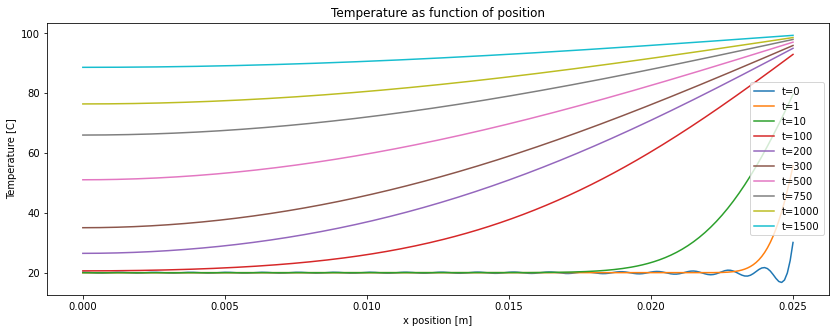

In [18]:
plt.figure(figsize=(14,5))
time_slice=[0,1,10,100,200,300,500,750,1000,1500]
for i in time_slice:
    plt.plot(x, T[i, :], label= f't={t[i]:1.0f}')
plt.title('Temperature as function of position')
plt.xlabel('x position [m]')
plt.ylabel('Temperature [C]')
plt.legend(loc='best')
plt.show()

# Problem 5

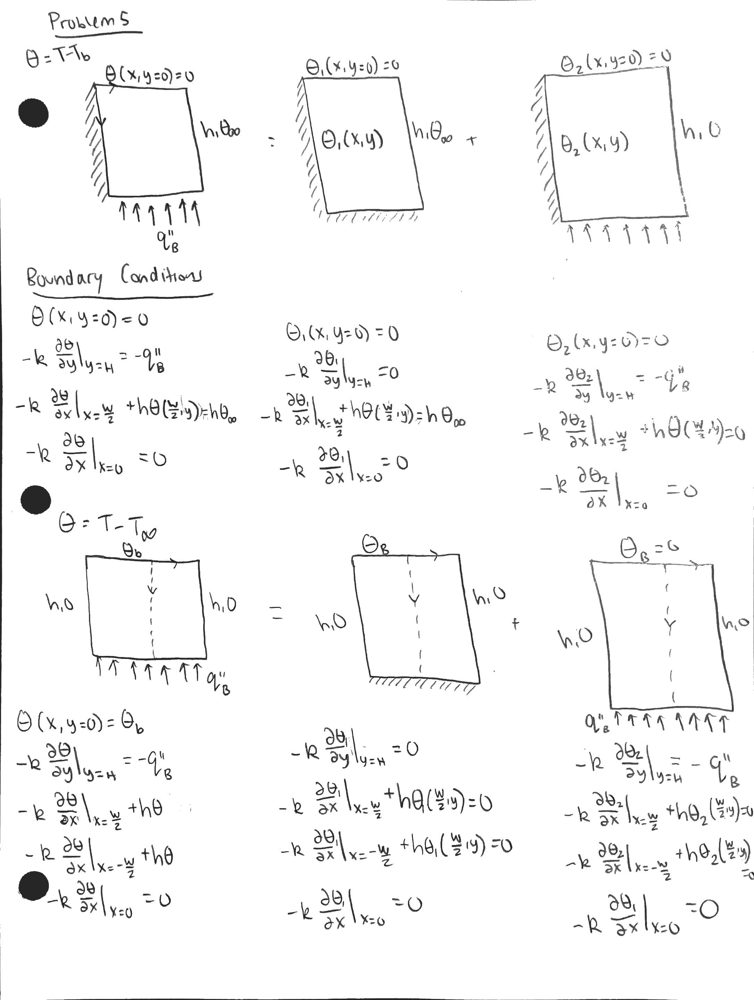

# Problem 6

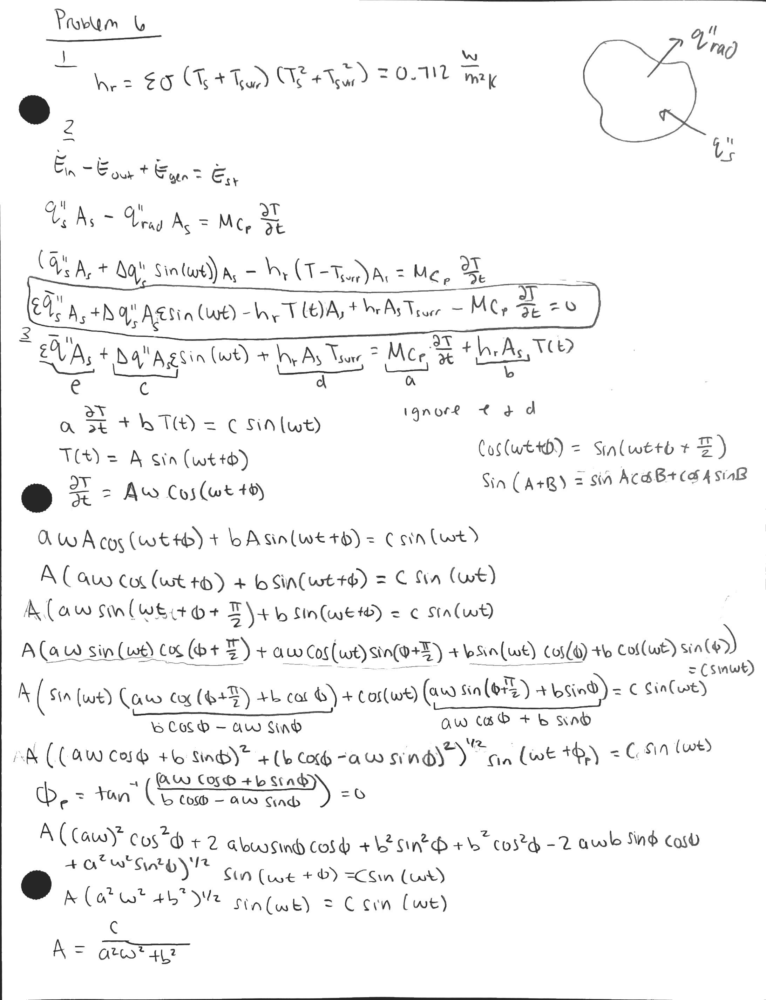

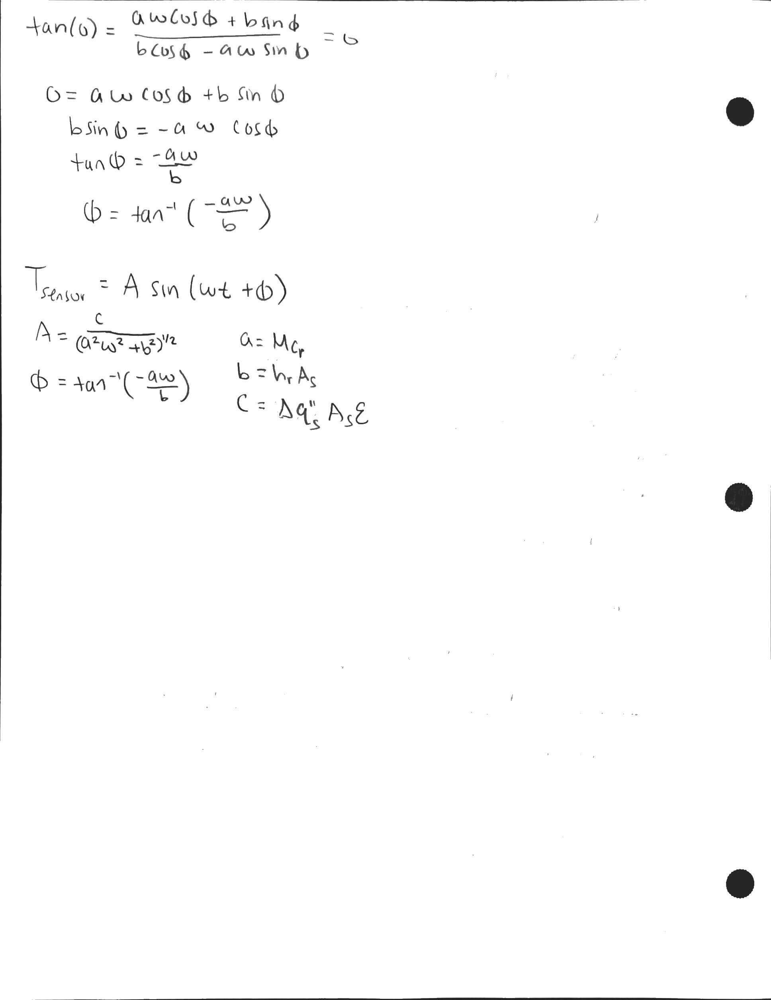

In [19]:
epsilon=0.35
sigma=5.67*10**-8
T=75
T_surr=300
hr=epsilon*sigma*(T+T_surr)*(T**2+T_surr**2)
print(hr)

0.7116292968749999


In [44]:
T_surr = 300  #[K] surroudnings temperature
epsilon = 0.35      #[-] Estimate for emissivity 
sigma=5.67*10**-8
M=0.05
As=0.02
omega=0.02094
cp=300
delq_dprime_s=100
a=M*cp
b=hr*As
c=delq_dprime_s*As*epsilon
A=c/((a**2)*(omega**2)+(b**2))**0.5
phi=math.atan(-a*omega/b)
print('Amplitude=', A)

Amplitude= 2.2263052654764186


In [40]:
#@title
# import a few more things
from scipy.integrate import odeint
from scipy.constants import Stefan_Boltzmann as sigma   #Stefan-Boltzmann Constant [W/m^2-K^4]
import math # math functions
import numpy as np # numerical math
from numpy import *
from scipy.linalg import solve
from scipy.constants import pi 

# Widgets
import ipywidgets as widgets
from IPython.display import display
from ipywidgets import interact

#plotting
params = {'legend.fontsize': 'xx-large',
          'figure.figsize': (15, 10),
         'axes.labelsize': 'xx-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'xx-large',
         'ytick.labelsize':'xx-large'}
import matplotlib.pyplot as plt
plt.rcParams.update(params)
# Additional Parameters
T_surr = 300  #[K] surroudnings temperature
epsilon = 0.35      #[-] Estimate for emissivity 
t_max=5000
sigma=5.67*10**-8
Ti=300
Qcc=5
M=0.05
As=0.02
omega=0.02094
cp=300
def model(y,t,a,b,c, d, T_surr):    # Set up the function that returns dTdt
    dTdt = a+b+c*sin(omega*t)+d*(y**4-T_surr**4)
    return dTdt

a = -Qcc/(M*cp)
b = 100*As/(M*cp)
c = 100*As/(M*cp)
d=-epsilon*sigma*As/(M*cp)

t = np.linspace(0,t_max,1000)

Tr = odeint(model,Ti, t, args=(a,b,c, d, T_surr))
T_ss=sum(Tr[-10:])/len(Tr[-10:])
Amplitude=T_ss-Tr[-1:]
print('Amplitude of 1', Amplitude)

Amplitude of 1 [[2.00511661]]
